# Import Library

In [80]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import os
import re
import time
import nltk
import torch
import timeit
import string
import random
import datetime
import textwrap
import torch
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from tqdm import tqdm
import tensorflow as tf
import matplotlib as mpl
import scipy.stats as st
import missingno as msno
from tqdm.auto import tqdm
from rich.text import Text
import plotly.express as px
from tensorflow import keras
from bs4 import BeautifulSoup
from string import punctuation
from collections import Counter
import matplotlib.pyplot as plt
from rich.console import Console
from sklearn.utils import shuffle
from nltk.corpus import stopwords
from transformers import pipeline
import matplotlib.ticker as ticker
import tensorflow_datasets as tfds
from keras.models import Sequential
from keras.layers import Dense, Dropout
from IPython.display import display, HTML
from wordcloud import WordCloud, STOPWORDS
from matplotlib.ticker import NullFormatter
from matplotlib.ticker import FuncFormatter
from IPython.display import HTML, display, Markdown
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler, TensorDataset
from tensorflow.keras.layers import Embedding, SpatialDropout1D, Bidirectional, LSTM, Dense, Dropout
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import ToktokTokenizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize.toktok import ToktokTokenizer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

# Load Data

In [81]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [82]:
df = pd.read_csv('/content/drive/My Drive/Big Data & Data Mining/FP/Sephora/product_info.csv')
dr = pd.read_csv('/content/drive/My Drive/Big Data & Data Mining/FP/Sephora/reviews.csv')

In [83]:
df.head(5)

,product_id,product_name,brand_id,brand_name,loves_count,rating,reviews,size,variation_type,variation_value,...,online_only,out_of_stock,sephora_exclusive,highlights,primary_category,secondary_category,tertiary_category,child_count,child_max_price,child_min_price
0,P473671,Fragrance Discovery Set,6342,19-69,6320,3.6364,11.0,NaN,NaN,NaN,...,1,0,0,"['Unisex/ Genderless Scent', 'Warm &Spicy Scen...",Fragrance,Value & Gift Sets,Perfume Gift Sets,0,NaN,NaN
1,P473668,La Habana Eau de Parfum,6342,19-69,3827,4.1538,13.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,85.0,30.0
2,P473662,Rainbow Bar Eau de Parfum,6342,19-69,3253,4.2500,16.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0
3,P473660,Kasbah Eau de Parfum,6342,19-69,3018,4.4762,21.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0
4,P473658,Purple Haze Eau de Parfum,6342,19-69,2691,3.2308,13.0,3.4 oz/ 100 mL,Size + Concentration + Formulation,3.4 oz/ 100 mL,...,1,0,0,"['Unisex/ Genderless Scent', 'Layerable Scent'...",Fragrance,Women,Perfume,2,75.0,30.0


# **Review dan Rekomendasi Produk**

# Preprocessing Data

In [84]:
string_to_check =['Remover' , 'remover' , 'Cleanser' , 'cleanser' , 'Make up cleanser' , 'bb cream' , 'bbcream' , 'BB' , 'Mask' , 'Masks' , 'mask' , 'Lip balm' , 'lip balm' , 'balm' , 'Gel' , 'gel' , 'make up remover' , 'Make up remover' ,'Hairdresser', 'Curl','Repair','Thickening',"Hairdresser",'Heat' ,'shampoo','Shampoo','hair','haircare','Haircare','Style','Styler','style','scalp','Scalp','Conditioner','conditioner','Frizz']
df = df[df['product_name'].str.contains('|'.join(string_to_check))]
df.reset_index()

,index,product_id,product_name,brand_id,brand_name,loves_count,rating,reviews,size,variation_type,...,online_only,out_of_stock,sephora_exclusive,highlights,primary_category,secondary_category,tertiary_category,child_count,child_max_price,child_min_price
0,18,P483068,ABBOTT Sampler Set,6485,ABBOTT,4493,4.8163,49.0,NaN,NaN,...,0,1,0,"['Vegan', 'Woody & Earthy Scent', 'Clean + Pla...",Fragrance,Value & Gift Sets,Perfume Gift Sets,0,NaN,NaN
1,47,P474806,Blue Tansy Reparative Mask,6321,adwoa beauty,14660,4.7581,492.0,16 oz/ 453 mg,Size,...,0,0,1,"['Good for: Damage', 'Good for: Color Care', '...",Hair,Hair Styling & Treatments,Hair Masks,0,NaN,NaN
2,48,P457233,Baomint Leave In Conditioning Styler,6321,adwoa beauty,13333,4.3472,144.0,14 oz/ 414 mL,Size,...,0,0,1,"['Clean at Sephora', 'All Hair Types', 'Curl-E...",Hair,Hair Styling & Treatments,Leave-In Conditioner,1,13.0,13.0
3,49,P474808,Blue Tansy Leave in Conditioning Styler,6321,adwoa beauty,11674,4.5762,210.0,14 oz/ 414 mL,Size,...,0,0,0,"['Good for: Damage', 'Vegan', 'Clean at Sephor...",Hair,Hair Styling & Treatments,Leave-In Conditioner,0,NaN,NaN
4,50,P457234,Baomint Moisturizing Shampoo,6321,adwoa beauty,11122,4.1324,136.0,14 oz/ 414 mL,Size,...,0,0,1,"['Unisex/ Genderless Scent', 'Clean at Sephora...",Hair,Shampoo & Conditioner,Shampoo,1,12.0,12.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1808,8404,P440307,Superberry Hydrate + Glow Dream Night Mask wit...,6169,Youth To The People,248887,4.3237,2354.0,2 oz/ 59 mL,Size,...,0,0,0,"['Vegan', 'Good for: Dullness/Uneven Texture',...",Skincare,Masks,Face Masks,1,18.0,18.0
1809,8405,P461555,Mini Superberry Hydrate + Glow Dream Mask,6169,Youth To The People,79524,4.3237,2354.0,0.5 oz/ 15 mL,Size,...,0,0,0,"['Good for: Dullness/Uneven Texture', 'allure ...",Skincare,Mini Size,NaN,0,NaN,NaN
1810,8418,P470065,Superclay Purify + Clear Power Mask with Niaci...,6169,Youth To The People,62672,4.4595,346.0,2.0 oz/ 60 mL,Size,...,0,0,0,"['Vegan', 'Best for Oily Skin', 'Good for: Por...",Skincare,Masks,Face Masks,0,NaN,NaN
1811,8460,P502049,Libre Eau de Parfum Lifestyle Gift Set,1070,Yves Saint Laurent,16392,4.0000,4.0,NaN,NaN,...,0,1,0,NaN,Fragrance,Value & Gift Sets,Perfume Gift Sets,0,NaN,NaN


In [85]:
dr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 602130 entries, 0 to 602129
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Unnamed: 0                602130 non-null  int64  
 1   author_id                 602130 non-null  object 
 2   rating                    602130 non-null  int64  
 3   is_recommended            484644 non-null  float64
 4   helpfulness               270298 non-null  float64
 5   total_feedback_count      602130 non-null  int64  
 6   total_neg_feedback_count  602130 non-null  int64  
 7   total_pos_feedback_count  602130 non-null  int64  
 8   submission_time           602130 non-null  object 
 9   review_text               601131 non-null  object 
 10  review_title              435119 non-null  object 
 11  skin_tone                 496074 non-null  object 
 12  eye_color                 463642 non-null  object 
 13  skin_type                 527447 non-null  o

In [86]:
dr = dr.drop(columns=['Unnamed: 0', 'author_id'])
dr.head(5)

,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,review_text,review_title,skin_tone,eye_color,skin_type,hair_color,product_id,product_name,brand_name,price_usd
0,5,1.0,1.0,2,0,2,2023-02-01,I use this with the Nudestix “Citrus Clean Bal...,Taught me how to double cleanse!,NaN,brown,dry,black,P504322,Gentle Hydra-Gel Face Cleanser,NUDESTIX,19.0
1,1,0.0,NaN,0,0,0,2023-03-21,I bought this lip mask after reading the revie...,Disappointed,NaN,NaN,NaN,NaN,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0
2,5,1.0,NaN,0,0,0,2023-03-21,My review title says it all! I get so excited ...,New Favorite Routine,light,brown,dry,blonde,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0
3,5,1.0,NaN,0,0,0,2023-03-20,I’ve always loved this formula for a long time...,Can't go wrong with any of them,NaN,brown,combination,black,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0
4,5,1.0,NaN,0,0,0,2023-03-20,"If you have dry cracked lips, this is a must h...",A must have !!!,light,hazel,combination,NaN,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0


In [87]:
cols = df.columns.difference(dr.columns)
cols = list(cols)
cols.append('product_id')
print(cols)

['brand_id', 'child_count', 'child_max_price', 'child_min_price', 'highlights', 'ingredients', 'limited_edition', 'loves_count', 'new', 'online_only', 'out_of_stock', 'primary_category', 'reviews', 'sale_price_usd', 'secondary_category', 'sephora_exclusive', 'size', 'tertiary_category', 'value_price_usd', 'variation_desc', 'variation_type', 'variation_value', 'product_id']


In [88]:
d_fr = pd.merge(dr, df[cols], how='outer', on=['product_id', 'product_id'])

In [89]:
d_fr.columns

Index(['rating', 'is_recommended', 'helpfulness', 'total_feedback_count',
       'total_neg_feedback_count', 'total_pos_feedback_count',
       'submission_time', 'review_text', 'review_title', 'skin_tone',
       'eye_color', 'skin_type', 'hair_color', 'product_id', 'product_name',
       'brand_name', 'price_usd', 'brand_id', 'child_count', 'child_max_price',
       'child_min_price', 'highlights', 'ingredients', 'limited_edition',
       'loves_count', 'new', 'online_only', 'out_of_stock', 'primary_category',
       'reviews', 'sale_price_usd', 'secondary_category', 'sephora_exclusive',
       'size', 'tertiary_category', 'value_price_usd', 'variation_desc',
       'variation_type', 'variation_value'],
      dtype='object')

In [90]:
d_fr.shape

(603882, 39)

In [91]:
missing = []
unique=[]
type=[]
variables=[]
count = []
for item in d_fr.columns:
    variables.append(item)
    missing.append(d_fr[item].isnull().sum())
    unique.append(d_fr[item].nunique())
    type.append(d_fr[item].dtype)
    count.append(len(d_fr[item]))
output=pd.DataFrame({'variables':variables,'missing':missing,'unique':unique,'dtype':type, 'count':count})
output.sort_values(by='missing',ascending=False)

,variables,missing,unique,dtype,count
36,variation_desc,603791,74,object,603882
30,sale_price_usd,602698,19,float64,603882
35,value_price_usd,601400,45,float64,603882
19,child_max_price,504063,98,float64,603882
20,child_min_price,504063,78,float64,603882
34,tertiary_category,478781,79,object,603882
21,highlights,440440,1106,object,603882
38,variation_value,437839,550,object,603882
37,variation_type,437804,6,object,603882
33,size,436596,536,object,603882


In [92]:
def check_d_fr(d_fr: object, head: object = 5) -> object:
    print("\nShape")
    print(d_fr.shape)
    print("\nTypes")
    print(d_fr.dtypes)
    print("\nNANs")
    print(d_fr.isnull().sum())
    print("\nInfo")
    print(d_fr.info())
check_d_fr(d_fr)


Shape
(603882, 39)

Types
rating                      float64
is_recommended              float64
helpfulness                 float64
total_feedback_count        float64
total_neg_feedback_count    float64
total_pos_feedback_count    float64
submission_time              object
review_text                  object
review_title                 object
skin_tone                    object
eye_color                    object
skin_type                    object
hair_color                   object
product_id                   object
product_name                 object
brand_name                   object
price_usd                   float64
brand_id                    float64
child_count                 float64
child_max_price             float64
child_min_price             float64
highlights                   object
ingredients                  object
limited_edition             float64
loves_count                 float64
new                         float64
online_only                 float64
o

In [93]:
print('Number of duplicated rows: ' , len(d_fr[d_fr.duplicated()]))

Number of duplicated rows:  117


In [94]:
d_fr_cleaned = d_fr.drop_duplicates(inplace=True)

In [95]:
pt_missing = d_fr.isna().mean()
pt_missing

,0
rating,0.002902
is_recommended,0.197429
helpfulness,0.552356
total_feedback_count,0.002902
total_neg_feedback_count,0.002902
total_pos_feedback_count,0.002902
submission_time,0.002902
review_text,0.004556
review_title,0.279483
skin_tone,0.178508


In [96]:
d_fr.describe()

,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,price_usd,brand_id,child_count,child_max_price,child_min_price,limited_edition,loves_count,new,online_only,out_of_stock,reviews,sale_price_usd,sephora_exclusive,value_price_usd
count,602013.000000,484564.000000,270272.000000,602013.000000,602013.000000,602013.000000,602013.000000,170153.000000,170153.000000,99795.000000,99795.000000,170153.000000,1.701530e+05,170153.000000,170153.000000,170153.000000,170105.000000,1184.000000,170153.000000,2482.000000
mean,4.311812,0.837912,0.769759,3.661291,0.765576,2.895715,45.725529,5114.314687,1.142948,45.048382,20.516574,0.021269,2.140967e+05,0.029033,0.177887,0.014793,4688.321272,6.158353,0.273278,206.284045
std,1.143724,0.368532,0.319067,25.850799,4.968584,22.631046,35.746052,1671.561960,1.176724,38.480155,12.513711,0.144280,2.992383e+05,0.167899,0.382419,0.120722,4210.946884,1.600046,0.445643,23.517848
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1065.000000,0.000000,3.500000,3.500000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,20.000000
25%,4.000000,1.000000,0.666667,0.000000,0.000000,0.000000,23.500000,4164.000000,0.000000,24.000000,15.000000,0.000000,3.809700e+04,0.000000,0.000000,0.000000,1899.000000,6.000000,0.000000,210.000000
50%,5.000000,1.000000,0.944444,0.000000,0.000000,0.000000,38.000000,5972.000000,1.000000,32.000000,18.000000,0.000000,1.057300e+05,0.000000,0.000000,0.000000,2961.000000,6.000000,0.000000,210.000000
75%,5.000000,1.000000,1.000000,3.000000,0.000000,2.000000,60.000000,6169.000000,2.000000,58.000000,24.000000,0.000000,2.488870e+05,0.000000,0.000000,0.000000,5841.000000,6.000000,1.000000,210.000000
max,5.000000,1.000000,1.000000,5464.000000,573.000000,5050.000000,380.000000,8020.000000,26.000000,399.000000,399.000000,1.000000,1.081315e+06,1.000000,1.000000,1.000000,16118.000000,32.250000,1.000000,290.000000


In [97]:
d_fr['limited_edition'] = df['limited_edition'].astype(bool)
d_fr['new']= df['new'].astype(bool)
d_fr['online_only']= df['online_only'].astype(bool)
d_fr['out_of_stock'] = df['out_of_stock'].astype(bool)
d_fr['sephora_exclusive'] = df['sephora_exclusive'].astype(bool)
d_fr[['limited_edition', 'new', 'online_only', 'out_of_stock', 'sephora_exclusive']]

,limited_edition,new,online_only,out_of_stock,sephora_exclusive
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...
603877,NaN,NaN,NaN,NaN,NaN
603878,NaN,NaN,NaN,NaN,NaN
603879,NaN,NaN,NaN,NaN,NaN
603880,NaN,NaN,NaN,NaN,NaN


In [98]:
numeric_cols = d_fr.select_dtypes(include = ['number']).columns
print(numeric_cols)
print(f'{len(numeric_cols)} Numeric Columns in Reviews dataset')

Index(['rating', 'is_recommended', 'helpfulness', 'total_feedback_count',
       'total_neg_feedback_count', 'total_pos_feedback_count', 'price_usd',
       'brand_id', 'child_count', 'child_max_price', 'child_min_price',
       'loves_count', 'reviews', 'sale_price_usd', 'value_price_usd'],
      dtype='object')
15 Numeric Columns in Reviews dataset


In [99]:
non_numeric_cols = d_fr.select_dtypes(exclude=['number']).columns
print(non_numeric_cols)
print(f'{len(non_numeric_cols)} Non-Numeric Columns in Reviews dataset')

Index(['submission_time', 'review_text', 'review_title', 'skin_tone',
       'eye_color', 'skin_type', 'hair_color', 'product_id', 'product_name',
       'brand_name', 'highlights', 'ingredients', 'limited_edition', 'new',
       'online_only', 'out_of_stock', 'primary_category', 'secondary_category',
       'sephora_exclusive', 'size', 'tertiary_category', 'variation_desc',
       'variation_type', 'variation_value'],
      dtype='object')
24 Non-Numeric Columns in Reviews dataset


# EDA

In [100]:
# Finding unique data
d_fr.apply(lambda x: len(x.unique()))

,0
rating,6
is_recommended,3
helpfulness,2315
total_feedback_count,552
total_neg_feedback_count,208
total_pos_feedback_count,485
submission_time,5318
review_text,508468
review_title,202374
skin_tone,15


In [101]:
unique = d_fr.nunique().sort_values()
unique_values = d_fr.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
brand_id,196,"[6317.0, nan, 1254.0, 4348.0, 3297.0, 4028.0, ..."
brand_name,60,"[nan, Peter Thomas Roth, Caudalie, CLINIQUE, f..."
child_count,18,"[7.0, nan, 0.0, 2.0, 3.0, 1.0, 6.0, 5.0, 4.0, ..."
child_max_price,98,"[22.0, nan, 31.5, 45.0, 26.0, 51.0, 13.0, 35.0..."
child_min_price,78,"[11.0, nan, 13.0, 6.5, 26.0, 14.0, 35.0, 20.0,..."
eye_color,6,"[nan, brown, green, hazel, blue, Grey, gray]"
hair_color,7,"[nan, brown, blonde, black, gray, red, auburn,..."
helpfulness,2314,"[nan, 1.0, 0.6666669845581055, 0.1428570002317..."
highlights,1106,"[['Medium Coverage', 'Waterproof', 'Matte Fini..."
ingredients,1489,"[['Brow Gel:', 'Water/Aqua/Eau, Butylene Glyco..."


In [102]:
# Dropping non-numerical data
hc = d_fr.drop(columns=['submission_time', 'review_text', 'skin_tone',
       'eye_color', 'skin_type', 'hair_color', 'product_id', 'product_name',
       'brand_name', 'highlights', 'ingredients', 'limited_edition', 'new',
       'online_only', 'out_of_stock', 'primary_category', 'secondary_category',
       'sephora_exclusive', 'size', 'tertiary_category',
       'variation_type', 'variation_value'])

In [103]:
hc.corr(numeric_only=True)

,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,price_usd,brand_id,child_count,child_max_price,child_min_price,loves_count,reviews,sale_price_usd,value_price_usd
rating,1.000000,0.847715,0.209879,-0.072467,-0.169236,-0.045622,-0.010415,-0.054675,0.029452,-0.025177,-0.027906,0.009669,0.017326,NaN,NaN
is_recommended,0.847715,1.000000,0.160045,-0.069508,-0.154645,-0.045794,0.010899,-0.069718,-0.003928,-0.001900,0.025213,-0.017558,-0.013554,NaN,NaN
helpfulness,0.209879,0.160045,1.000000,0.014181,-0.188105,0.057268,-0.047426,-0.017571,0.004203,-0.047917,-0.086388,0.012767,0.018679,NaN,NaN
total_feedback_count,-0.072467,-0.069508,0.014181,1.000000,0.703767,0.987761,0.016981,0.033617,-0.003844,-0.008990,0.000477,0.013040,0.000388,NaN,NaN
total_neg_feedback_count,-0.169236,-0.154645,-0.188105,0.703767,1.000000,0.584346,0.017425,0.036576,-0.005797,-0.002914,-0.000032,0.012624,0.000021,NaN,NaN
total_pos_feedback_count,-0.045622,-0.045794,0.057268,0.987761,0.584346,1.000000,0.015571,0.030183,-0.003129,-0.009389,0.000530,0.012020,0.000429,NaN,NaN
price_usd,-0.010415,0.010899,-0.047426,0.016981,0.017425,0.015571,1.000000,0.045440,0.056419,0.641905,0.191152,-0.167410,-0.222052,NaN,NaN
brand_id,-0.054675,-0.069718,-0.017571,0.033617,0.036576,0.030183,0.045440,1.000000,-0.015994,-0.138554,-0.110421,0.250621,0.167215,0.033813,-0.081028
child_count,0.029452,-0.003928,0.004203,-0.003844,-0.005797,-0.003129,0.056419,-0.015994,1.000000,0.406933,-0.078683,0.644455,0.660782,0.138733,-0.337354
child_max_price,-0.025177,-0.001900,-0.047917,-0.008990,-0.002914,-0.009389,0.641905,-0.138554,0.406933,1.000000,0.296651,-0.231785,-0.174348,0.815185,0.986701


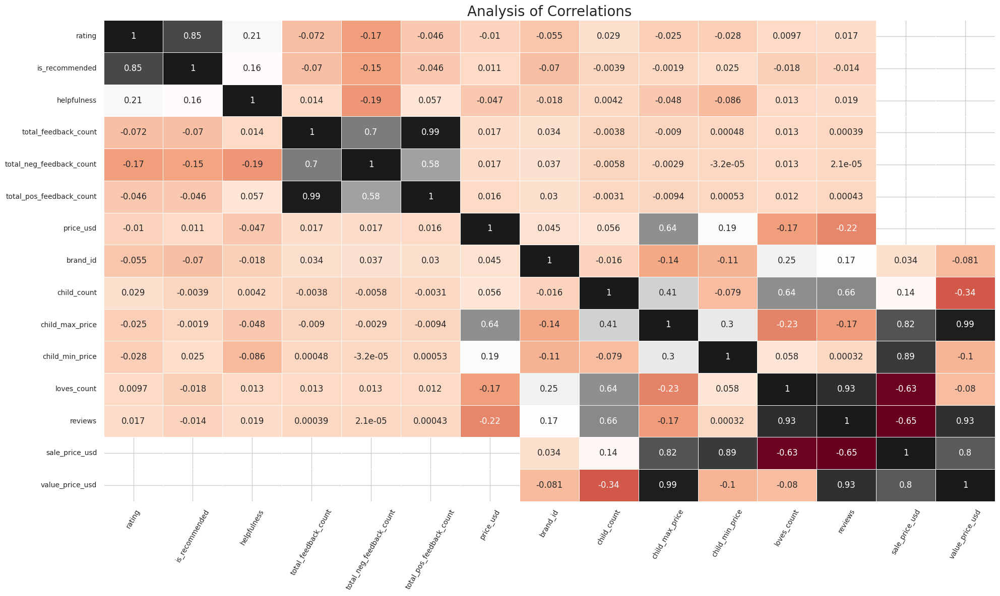

In [104]:
plt.figure(figsize=(20, 12))
sns.heatmap(hc.corr(numeric_only=True), cmap="RdGy", annot=True, linewidths=.6 , cbar = False)
plt.xticks(rotation=60, size=10)
plt.yticks(size=10)
plt.title('Analysis of Correlations', size=20)
plt.tight_layout()
plt.show()

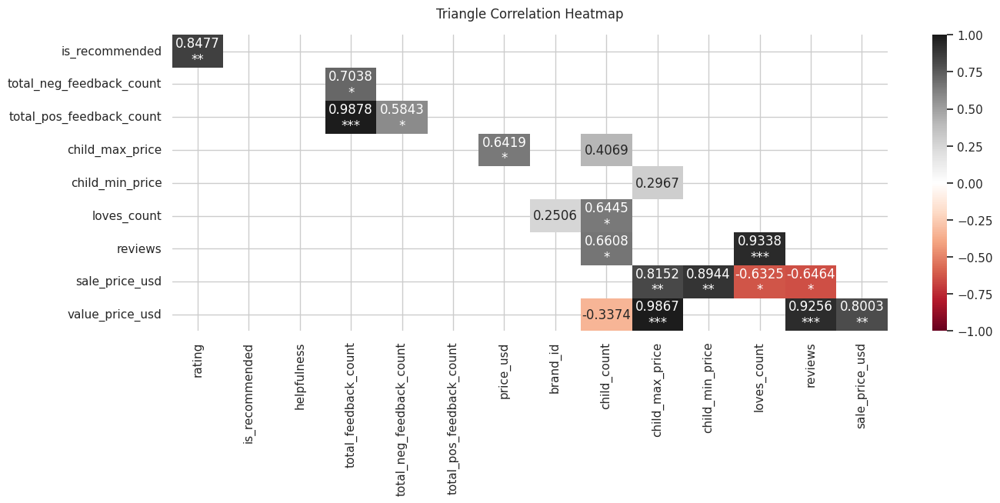

In [105]:
corr = hc.corr(numeric_only=True)
f, ax = plt.subplots(figsize=(15, 5))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
          for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='RdGy')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 12}, pad=16)
plt.show()

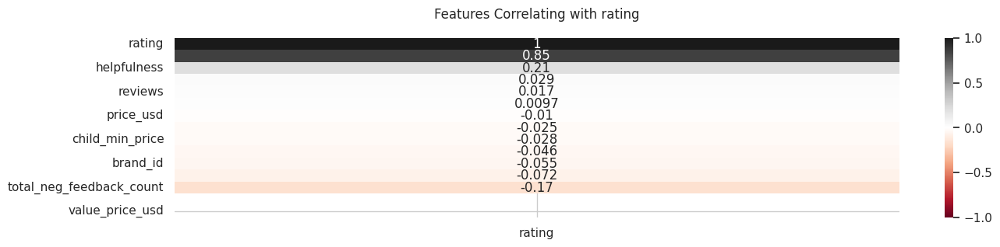

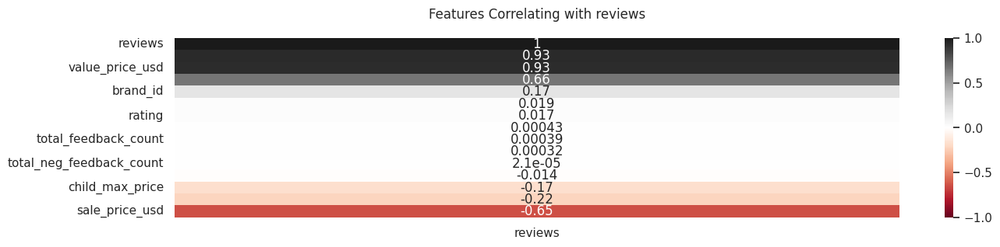

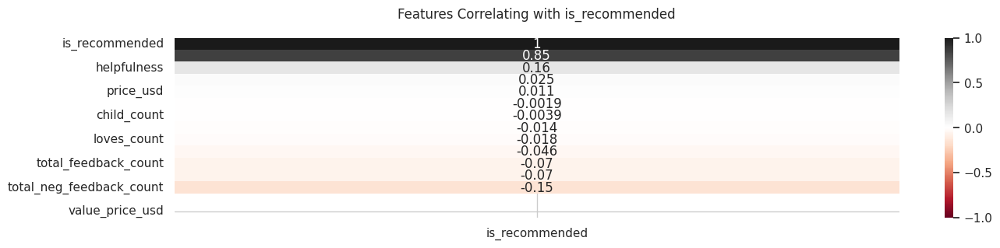

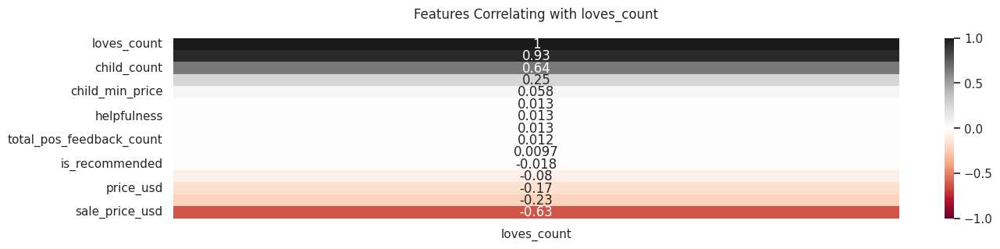

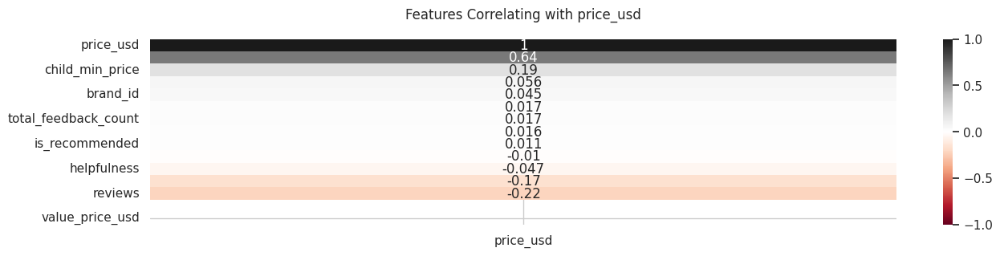

In [106]:
plt.figure (figsize = (15 , 3) , dpi = 100)
heatmap = sns.heatmap (hc.corr(numeric_only=True)[['rating']].sort_values (by = 'rating', ascending = False), vmin = -1, vmax = 1, annot = True, cmap = 'RdGy')
heatmap.set_title ('Features Correlating with rating', fontdict = {'fontsize':12} , pad = 18);

plt.figure (figsize = (15 , 3) , dpi = 100)
heatmap = sns.heatmap (hc.corr(numeric_only=True)[['reviews']].sort_values (by = 'reviews', ascending = False), vmin = -1, vmax = 1, annot = True, cmap = 'RdGy')
heatmap.set_title ('Features Correlating with reviews', fontdict = {'fontsize':12} , pad = 18);

plt.figure (figsize = (15 , 3) , dpi = 100)
heatmap = sns.heatmap (hc.corr(numeric_only=True)[['is_recommended']].sort_values (by = 'is_recommended', ascending = False), vmin = -1, vmax = 1, annot = True, cmap = 'RdGy')
heatmap.set_title ('Features Correlating with is_recommended', fontdict = {'fontsize':12} , pad = 18);

plt.figure (figsize = (15 , 3) , dpi = 100)
heatmap = sns.heatmap (hc.corr(numeric_only=True)[['loves_count']].sort_values (by = 'loves_count', ascending = False), vmin = -1, vmax = 1, annot = True, cmap = 'RdGy')
heatmap.set_title ('Features Correlating with loves_count', fontdict = {'fontsize':12} , pad = 18);

plt.figure (figsize = (15 , 3) , dpi = 100)
heatmap = sns.heatmap (hc.corr(numeric_only=True)[['price_usd']].sort_values (by = 'price_usd', ascending = False), vmin = -1, vmax = 1, annot = True, cmap = 'RdGy')
heatmap.set_title ('Features Correlating with price_usd', fontdict = {'fontsize':12} , pad = 18);

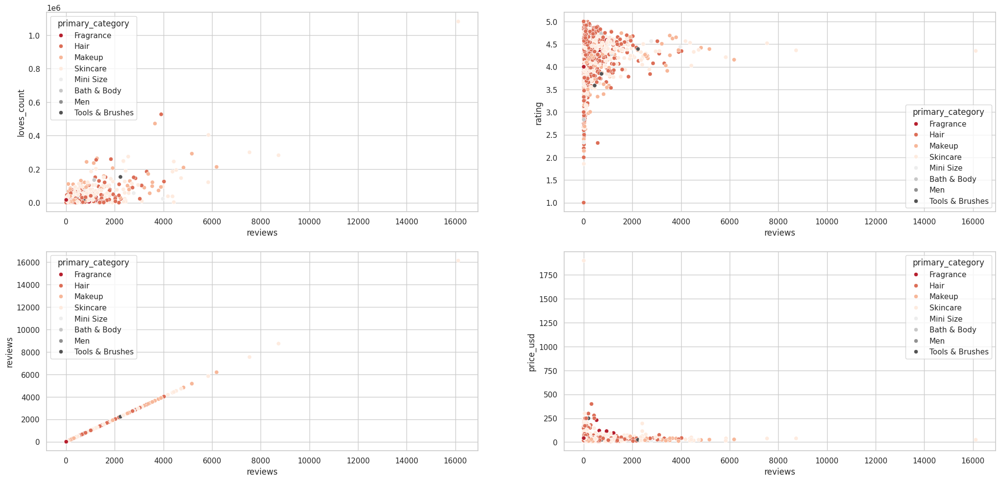

In [107]:
ff = ['loves_count','rating','reviews','price_usd']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,2,i+1)
    sns.scatterplot(x='reviews',y=col,hue='primary_category',data=df,palette="RdGy")

In [108]:
fig = px.scatter_3d(df, x='loves_count', y='rating', z='reviews', color='primary_category', color_continuous_scale="RdGy", template = 'plotly_white')
fig.update_traces(marker=dict(size=5))
fig.show()

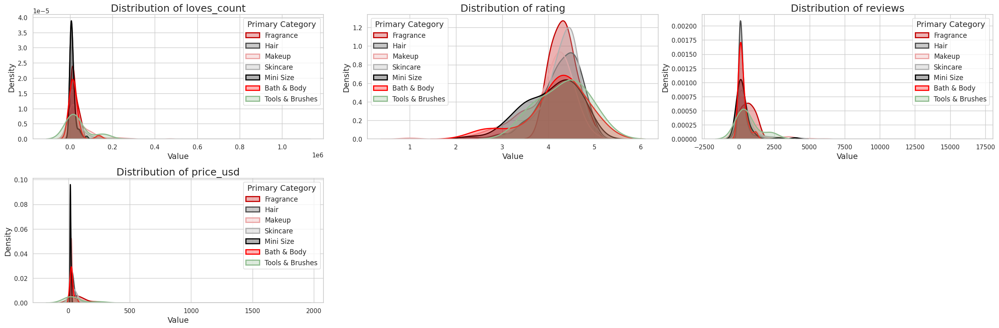

In [109]:
sns.set(style="whitegrid")
fig = plt.figure(figsize=(25, 20))
colors = {
    'Fragrance': '#C20000',
    'Hair': '#4C4C4C',
    'Makeup': '#EBA3A3',
    'Skincare': '#B0B0B0',
    'Mini Size': 'black',
    'Bath & Body': 'red',
    'Tools & Brushes': 'darkseagreen'}
for i, col in enumerate(ff):
    ax = fig.add_subplot(5, 3, i + 1)
    for category, color in colors.items():
        category_data = df[df['primary_category'] == category][col]
        if not category_data.empty:
            sns.kdeplot(
                category_data,
                color=color,
                label=category,
                linewidth=2,
                fill=True,
                alpha=0.3)
    ax.set_title(f'Distribution of {col}', fontsize=18)
    ax.set_xlabel("Value", fontsize=14)
    ax.set_ylabel("Density", fontsize=14)
    ax.legend(title='Primary Category', fontsize=12, title_fontsize=14)
plt.tight_layout()
plt.show()

In [110]:
# measure of skewness
df[ff].skew(axis = 0, skipna = True)

,0
loves_count,10.104482
rating,-1.585977
reviews,7.260202
price_usd,22.253801


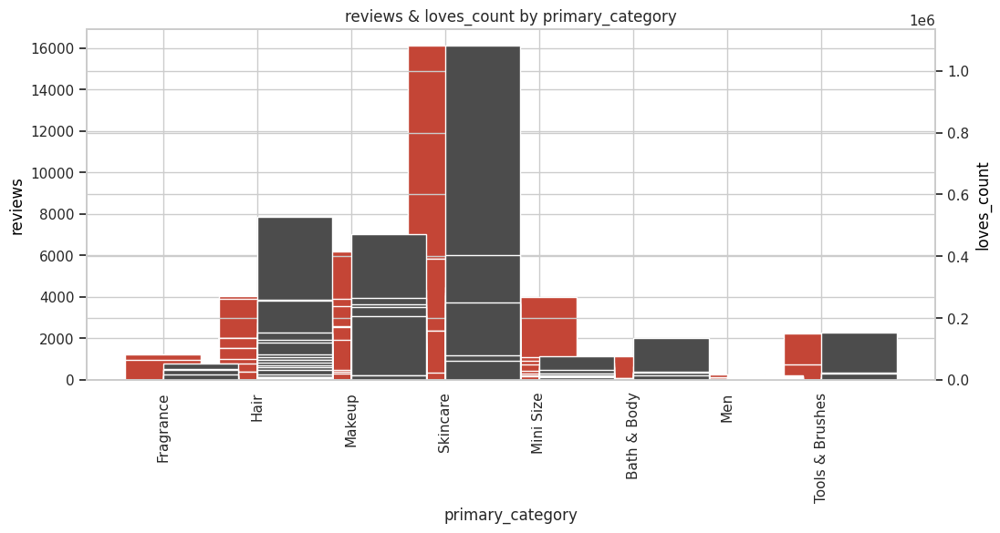

In [111]:
fig, ax1 = plt.subplots(figsize=(12,5))
ax1.bar(df['primary_category'], df['reviews'], color='#C44536', align='center')
ax1.set_ylabel('reviews', color='#000000')
plt.xticks(rotation=90)
plt.xlabel('primary_category')
ax2 = ax1.twinx()
ax2.bar(df['primary_category'], df['loves_count'], color='#4C4C4C', align='edge')
ax2.set_ylabel('loves_count', color='#000000')
plt.title('reviews & loves_count by primary_category')
plt.show()

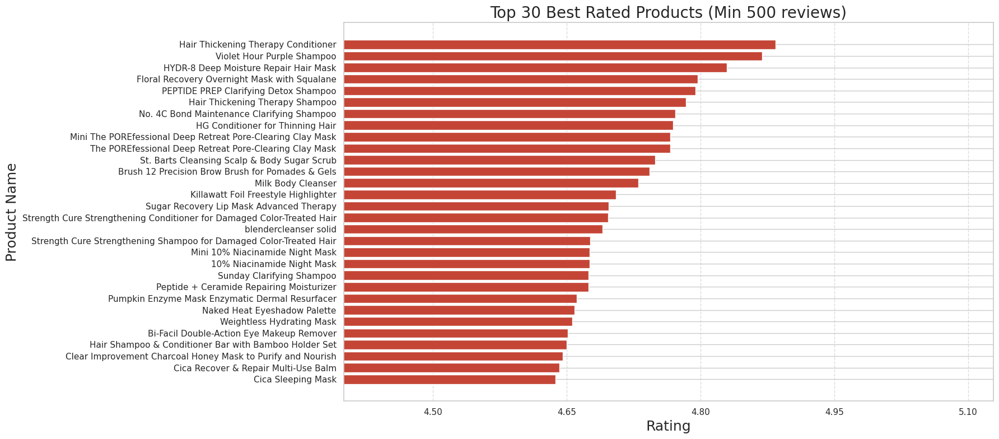

In [112]:
plt.figure(figsize=(18, 8), dpi=100)
brands1 = df[['product_name', 'brand_name', 'reviews', 'rating']].query('reviews > 500').sort_values('rating', ascending=False).head(30)
plt.barh(brands1['product_name'], brands1['rating'], color='#C44536')
plt.title('Top 30 Best Rated Products (Min 500 reviews)', fontsize=20)
plt.xlabel('Rating', fontsize=18)
plt.ylabel('Product Name', fontsize=18)
plt.gca().xaxis.set_major_locator(ticker.MaxNLocator(5))
plt.gca().invert_yaxis()
plt.xlim(4.4)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# **Sentiment Analysis**

# Preprocessing Data

In [113]:
RANDOM_STATE = 42
dr1 = dr.copy()

In [114]:
missing = []
unique=[]
type=[]
variables=[]
count = []
for item in dr1.columns:
    variables.append(item)
    missing.append(dr1[item].isnull().sum())
    unique.append(dr1[item].nunique())
    type.append(dr1[item].dtype)
    count.append(len(dr1[item]))
output=pd.DataFrame({'variables':variables,'missing':missing,'unique':unique,'type':type, 'count':count})
output.sort_values(by='missing',ascending=False)

,variables,missing,unique,type,count
2,helpfulness,331832,2314,float64,602130
8,review_title,167011,202373,object,602130
12,hair_color,141081,7,object,602130
10,eye_color,138488,6,object,602130
1,is_recommended,117486,2,float64,602130
9,skin_tone,106056,14,object,602130
11,skin_type,74683,4,object,602130
7,review_text,999,508467,object,602130
15,brand_name,0,60,object,602130
14,product_name,0,249,object,602130


In [115]:
cols_to_use = df.columns.difference(dr.columns)
cols_to_use = list(cols_to_use)
cols_to_use.append('product_id')
print(cols_to_use)

['brand_id', 'child_count', 'child_max_price', 'child_min_price', 'highlights', 'ingredients', 'limited_edition', 'loves_count', 'new', 'online_only', 'out_of_stock', 'primary_category', 'reviews', 'sale_price_usd', 'secondary_category', 'sephora_exclusive', 'size', 'tertiary_category', 'value_price_usd', 'variation_desc', 'variation_type', 'variation_value', 'product_id']


In [116]:
rating_counts = dr1['rating'].value_counts()
# Print the number of occurrences of each rating
print("Number of occurrences of each rating:")
print(rating_counts)

Number of occurrences of each rating:
rating
5    389000
4    106956
3     44018
1     32903
2     29253
Name: count, dtype: int64


In [117]:
is_recommended_counts = dr1['is_recommended'].value_counts()
# Print the number of occurrences of each rating
print("Number of occurrences of each is_recommended	:")
print(is_recommended_counts)

Number of occurrences of each is_recommended	:
is_recommended
1.0    406094
0.0     78550
Name: count, dtype: int64


In [118]:
d_fr = dr1[['review_text' , 'is_recommended' , 'rating']]
# change column names
dr1.rename(columns={'review_text':'text', 'is_recommended':'label'},  inplace=True)
dr1.head()

,rating,label,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,text,review_title,skin_tone,eye_color,skin_type,hair_color,product_id,product_name,brand_name,price_usd
0,5,1.0,1.0,2,0,2,2023-02-01,I use this with the Nudestix “Citrus Clean Bal...,Taught me how to double cleanse!,NaN,brown,dry,black,P504322,Gentle Hydra-Gel Face Cleanser,NUDESTIX,19.0
1,1,0.0,NaN,0,0,0,2023-03-21,I bought this lip mask after reading the revie...,Disappointed,NaN,NaN,NaN,NaN,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0
2,5,1.0,NaN,0,0,0,2023-03-21,My review title says it all! I get so excited ...,New Favorite Routine,light,brown,dry,blonde,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0
3,5,1.0,NaN,0,0,0,2023-03-20,I’ve always loved this formula for a long time...,Can't go wrong with any of them,NaN,brown,combination,black,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0
4,5,1.0,NaN,0,0,0,2023-03-20,"If you have dry cracked lips, this is a must h...",A must have !!!,light,hazel,combination,NaN,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0


In [119]:
def check_dr1(dr1: object, head: object = 5) -> object:
    print("\nShape")
    print(dr1.shape)
    print("\nTypes")
    print(dr1.dtypes)
    print("\nNANs")
    print(dr1.isnull().sum())
    print("\nInfo")
    print(dr1.info())
check_dr1(dr1)


Shape
(602130, 17)

Types
rating                        int64
label                       float64
helpfulness                 float64
total_feedback_count          int64
total_neg_feedback_count      int64
total_pos_feedback_count      int64
submission_time              object
text                         object
review_title                 object
skin_tone                    object
eye_color                    object
skin_type                    object
hair_color                   object
product_id                   object
product_name                 object
brand_name                   object
price_usd                   float64
dtype: object

NANs
rating                           0
label                       117486
helpfulness                 331832
total_feedback_count             0
total_neg_feedback_count         0
total_pos_feedback_count         0
submission_time                  0
text                           999
review_title                167011
skin_tone                 

In [120]:
dr1['label'].value_counts()

,count
label,
1.0,406094
0.0,78550


In [121]:
#Percentage of Positive/Negative
print("Positive: ", round(dr1.label.value_counts()[1]/len(dr1)*100 , 2 ),"%")
print("Negative: ", round(dr1.label.value_counts()[0]/len(dr1)*100, 2 ),"%")

Positive:  67.44 %
Negative:  13.05 %


In [122]:
dr1_neg=  dr1[dr1['label'] == 0]
dr1_pos=  dr1[dr1['label'] == 1].sample(len(dr1_neg))

dr2= pd.concat([dr1_pos, dr1_neg], axis=0)
# Shuffle the rows of the merged DataFrame
dr2 = shuffle(dr2)
dr2.head()

,rating,label,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,submission_time,text,review_title,skin_tone,eye_color,skin_type,hair_color,product_id,product_name,brand_name,price_usd
157249,5,1.0,1.000000,4,0,4,2020-08-09,I have pretty oily skin and this does a great ...,NaN,light,brown,oily,brown,P456412,Greek Yoghurt Foaming Cream Cleanser,KORRES,28.0
503894,3,0.0,NaN,0,0,0,2020-01-28,This product is really nice for wanting dewy s...,NaN,mediumTan,brown,combination,brown,P453825,Hydra Zen Glow Liquid Lightweight Moisturizer ...,Lancôme,54.0
528794,1,0.0,0.533333,15,7,8,2021-06-16,Bought it based on reviews and the fact that I...,Hard Pass,fair,green,dry,brown,P470529,Avocado Soothing Skin Barrier Serum with Ceram...,Glow Recipe,45.0
504224,3,0.0,NaN,0,0,0,2020-01-16,I received this product complimentary to try a...,Nice but not for sensitive skin!,medium,brown,combination,brown,P453825,Hydra Zen Glow Liquid Lightweight Moisturizer ...,Lancôme,54.0
266294,4,1.0,NaN,0,0,0,2021-05-27,"This product went on smoothly, dried quickly a...",NaN,lightMedium,green,combination,brown,P426183,Mini Facial Treatment Essence (Pitera Essence),SK-II,99.0


In [123]:
print("Positive: ", round(dr2.label.value_counts()[1]/len(dr2)*100 , 2 ),"%")
print("Negative: ", round(dr2.label.value_counts()[0]/len(dr2)*100, 2 ),"%")

Positive:  50.0 %
Negative:  50.0 %


In [124]:
# Remove extra characters
dr2['text']=dr2['text'].str.replace('[^\w\s]','')

In [125]:
# Tokenizer
tokenizer = ToktokTokenizer()  # Initializes a tokenizer, which is used to break down text into individual tokens (words or phrases) for further processing.

# Set the stopword list
stopword_list = nltk.corpus.stopwords.words('english')  # Retrieves a list of common English stopwords from the NLTK library.
stop = set(stopword_list)  # Converts the list of stopwords into a set for faster lookup when filtering.

# Remove HTML tags
def strip_html(text):
    soup = BeautifulSoup(text, "html.parser")  # Parses the input text to handle HTML tags.
    return soup.get_text()  # Extracts and returns the plain text, stripping away any HTML formatting.

# Remove square brackets
def remove_between_square_brackets(text):
    return re.sub(r'\[.*?\]', '', text)  # Uses regex to find and remove any content between square brackets, as this often contains irrelevant information.

# Remove noise from text
def denoise_text(text):
    text = strip_html(text)  # First, strip HTML tags from the text.
    text = remove_between_square_brackets(text)  # Then, remove any content within square brackets to clean the text.
    return text  # Returns the cleaned text free of HTML and bracketed content.

# Remove special characters
def remove_special_characters(text, remove_digits=True):
    if remove_digits:
        pattern = r'[^a-zA-Z\s]'  # Creates a regex pattern to match any character that is not a letter or whitespace, effectively removing special characters and digits.
    else:
        pattern = r'[^a-zA-Z0-9\s]'  # This pattern allows numbers to remain in the text while still removing special characters.
    text = re.sub(pattern, '', text)  # Applies the regex pattern to the text, removing unwanted characters.
    return text  # Returns the cleaned text.

# Stem the text
def simple_stemmer(text):
    ps = nltk.porter.PorterStemmer()  # Initializes the Porter Stemmer, which reduces words to their base or root form.
    text = ' '.join([ps.stem(word) for word in text.split()])  # Applies stemming to each word in the text and rejoins them into a single string.
    return text  # Returns the stemmed text.

# Remove stopwords
def remove_stopwords(text, is_lower_case=False):
    tokens = tokenizer.tokenize(text)  # Tokenizes the input text into individual words or tokens.
    tokens = [token.strip() for token in tokens]  # Strips whitespace from each token.
    if is_lower_case:
        # If the input text is already in lowercase, filter out stopwords without converting.
        filtered_tokens = [token for token in tokens if token not in stop]
    else:
        # If the input text is not in lowercase, convert tokens to lowercase for stopword comparison.
        filtered_tokens = [token for token in tokens if token.lower() not in stop]
    filtered_text = ' '.join(filtered_tokens)  # Joins the filtered tokens back into a single string.
    return filtered_text  # Returns the cleaned text with stopwords removed.

In [126]:
# Remove digits
# Regex (regular expressions)
dr2['text'] = dr2['text'].str.replace(r'\d+', '', regex=True)
# Remove leading and trailing spaces
dr2['text'] = dr2['text'].str.replace(r'^\s+|\s+$', '', regex=True)
# Make the text lowercase
dr2['text'] = dr2['text'].str.lower()

# EDA

In [127]:
hr = dr.drop(columns=['submission_time', 'review_text', 'review_title', 'skin_tone',
       'eye_color', 'skin_type', 'hair_color', 'product_id', 'product_name', 'brand_name'])

In [128]:
hr.corr(numeric_only=True)

,rating,is_recommended,helpfulness,total_feedback_count,total_neg_feedback_count,total_pos_feedback_count,price_usd
rating,1.000000,0.847716,0.209799,-0.072465,-0.169225,-0.045621,-0.010423
is_recommended,0.847716,1.000000,0.160032,-0.069508,-0.154639,-0.045795,0.010892
helpfulness,0.209799,0.160032,1.000000,0.014199,-0.188075,0.057282,-0.047374
total_feedback_count,-0.072465,-0.069508,0.014199,1.000000,0.703768,0.987761,0.016985
total_neg_feedback_count,-0.169225,-0.154639,-0.188075,0.703768,1.000000,0.584346,0.017427
total_pos_feedback_count,-0.045621,-0.045795,0.057282,0.987761,0.584346,1.000000,0.015575
price_usd,-0.010423,0.010892,-0.047374,0.016985,0.017427,0.015575,1.000000


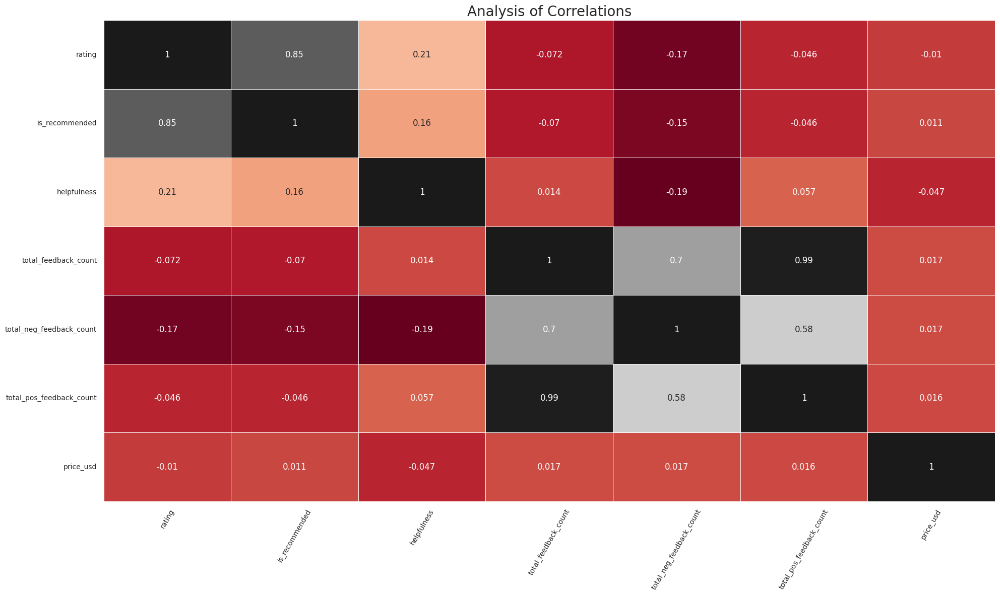

In [129]:
plt.figure(figsize=(20, 12))
sns.heatmap(hr.corr(numeric_only=True), cmap="RdGy", annot=True, linewidths=.6 , cbar = False)
plt.xticks(rotation=60, size=10)
plt.yticks(size=10)
plt.title('Analysis of Correlations', size=20)
plt.tight_layout()
plt.show()

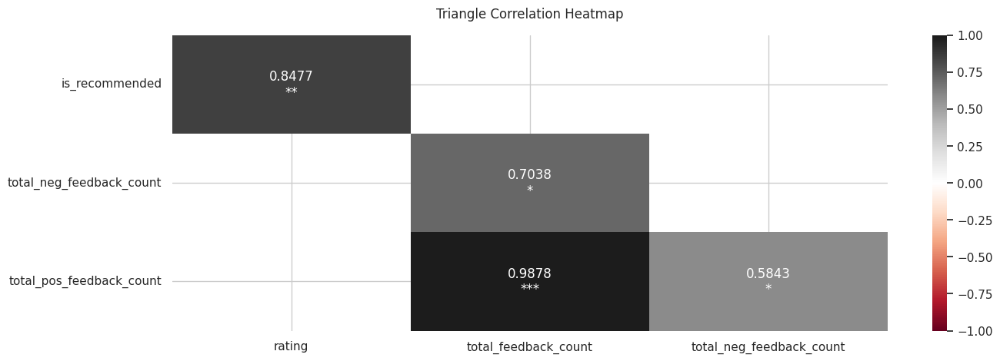

In [130]:
corr = hr.corr(numeric_only=True)
f, ax = plt.subplots(figsize=(15, 5))
mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
extreme_1 = 0.5
extreme_2 = 0.75
extreme_3 = 0.9
mask |= np.abs(corr) < cut_off
corr = corr[~mask]
remove_empty_rows_and_cols = True
if remove_empty_rows_and_cols:
    wanted_cols = np.flatnonzero(np.count_nonzero(~mask, axis=1))
    wanted_rows = np.flatnonzero(np.count_nonzero(~mask, axis=0))
    corr = corr.iloc[wanted_cols, wanted_rows]

annot = [[f"{val:.4f}"
          + ('' if abs(val) < extreme_1 else '\n*')
          + ('' if abs(val) < extreme_2 else '*')
          + ('' if abs(val) < extreme_3 else '*')
          for val in row] for row in corr.to_numpy()]
heatmap = sns.heatmap(corr, vmin=-1, vmax=1, annot=annot, fmt='', cmap='RdGy')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize': 12}, pad=16)
plt.show()

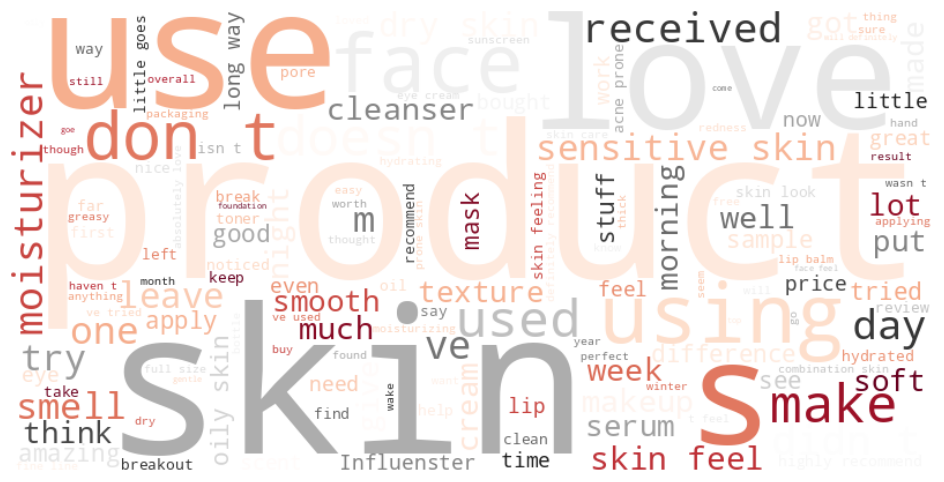

In [131]:
from wordcloud import WordCloud, STOPWORDS
# Extract the "review_text" column from the data frame
review_text = dr['review_text'].astype(str)

# Define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(["br", "href", "don t", "didn t", "don't", "doesn'", "didn't" ])  # Add any other stopwords you'd like to exclude

# Create a word cloud
word_cloud = WordCloud(stopwords=stopwords,
                       max_words=150,
                       background_color='white',
                       colormap='RdGy',  # Change the color scheme
                       width=800,
                       height=400).generate(' '.join(review_text))

# Display the generated word cloud
plt.figure(figsize=(12, 6))  # Modify the figure size
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

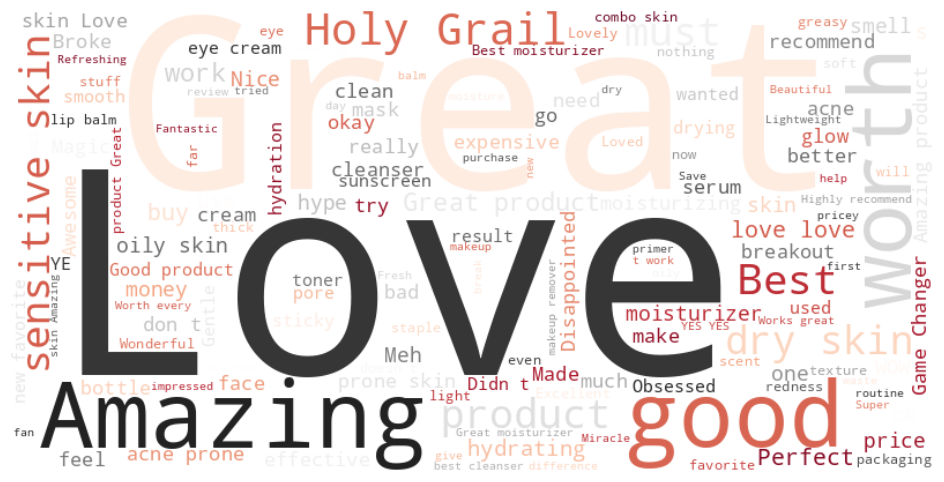

In [132]:
drrr = dr.dropna()
# Extract the "review_text" column from the data frame
review_text = drrr['review_title'].astype(str)
# Define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(["br", "href", "don t", "didn t", "don't", "doesn'", "didn't" ])  # Add any other stopwords you'd like to exclude
# Create a word cloud
word_cloud = WordCloud(stopwords=stopwords,
                       max_words=150,
                       background_color='white',
                       colormap='RdGy',  # Change the color scheme
                       width=800,
                       height=400).generate(' '.join(review_text))
# Display the generated word cloud
plt.figure(figsize=(12, 6))  # Modify the figure size
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [133]:
drc = dr.copy()
drcc = drc.drop(columns=['is_recommended','helpfulness','total_feedback_count','total_neg_feedback_count','total_pos_feedback_count','skin_tone','eye_color','skin_type','hair_color'])

In [134]:
wc = drcc[drcc['rating'] !=3]
wc['sentiment']= wc['rating'].apply(lambda rating: +1 if rating >3 else 0)
wc.head(2)

,rating,submission_time,review_text,review_title,product_id,product_name,brand_name,price_usd,sentiment
0,5,2023-02-01,I use this with the Nudestix “Citrus Clean Bal...,Taught me how to double cleanse!,P504322,Gentle Hydra-Gel Face Cleanser,NUDESTIX,19.0,1
1,1,2023-03-21,I bought this lip mask after reading the revie...,Disappointed,P420652,Lip Sleeping Mask Intense Hydration with Vitam...,LANEIGE,24.0,0


In [135]:
# Split df into positive and negative
positive = wc[wc['sentiment']==1]
negative = wc[wc['sentiment']==0]

In [136]:
# Distribution of reviews by sentiment
wc['sentimentanalysis'] = wc['sentiment'].replace({0: 'negative', 1: 'positive'})
fig = px.histogram(wc, x='sentimentanalysis')
fig.update_traces(marker_color=wc['sentimentanalysis'].map({'negative': 'red', 'positive': 'blue'}))
fig.update_layout(
    title_text='Product Sentiment',
    paper_bgcolor='white',
    plot_bgcolor='white')
fig.show()

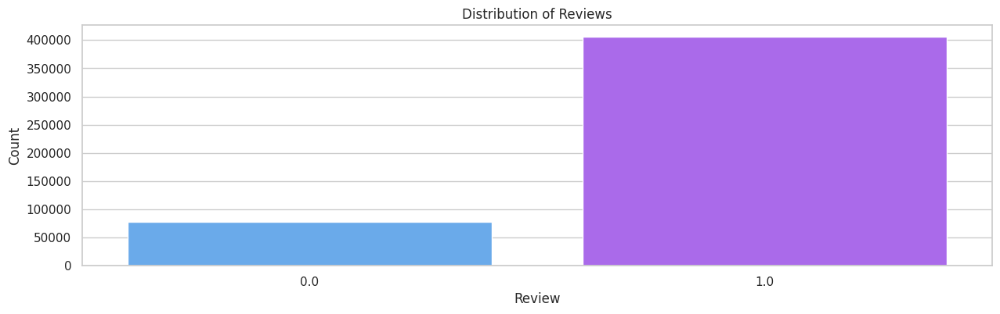

In [137]:
sns.set(style="whitegrid")
plt.figure(figsize=(15, 4))
sns.countplot(x='label', data=dr1, palette='cool')
plt.title('Distribution of Reviews')
plt.xlabel('Review')
plt.ylabel('Count')
plt.show()

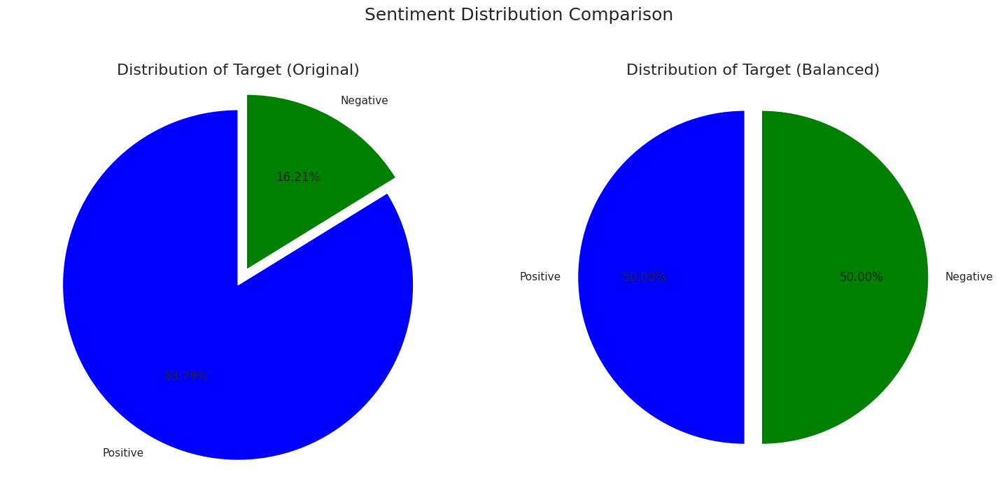

In [138]:
sns.set(style="whitegrid")
fig, axs = plt.subplots(1, 2, figsize=(15, 7))
colors = ['blue', 'green']
dr1_counts = dr1['label'].value_counts()
axs[0].pie(dr1_counts, labels=['Positive', 'Negative'], autopct='%.2f%%', explode=[0.05, 0.05], colors=colors, startangle=90, wedgeprops={'edgecolor': 'white'})
axs[0].set_title('Distribution of Target (Original)', fontsize=16)
dr2_counts = dr2['label'].value_counts()
axs[1].pie(dr2_counts, labels=['Positive', 'Negative'], autopct='%.2f%%', explode=[0.05, 0.05], colors=colors, startangle=90, wedgeprops={'edgecolor': 'white'})
axs[1].set_title('Distribution of Target (Balanced)', fontsize=16)
for ax in axs:
    ax.axis('equal')
plt.suptitle('Sentiment Distribution Comparison', fontsize=18)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [139]:
# Sentiment count
dr2['label'].value_counts()

,count
label,
1.0,78550
0.0,78550


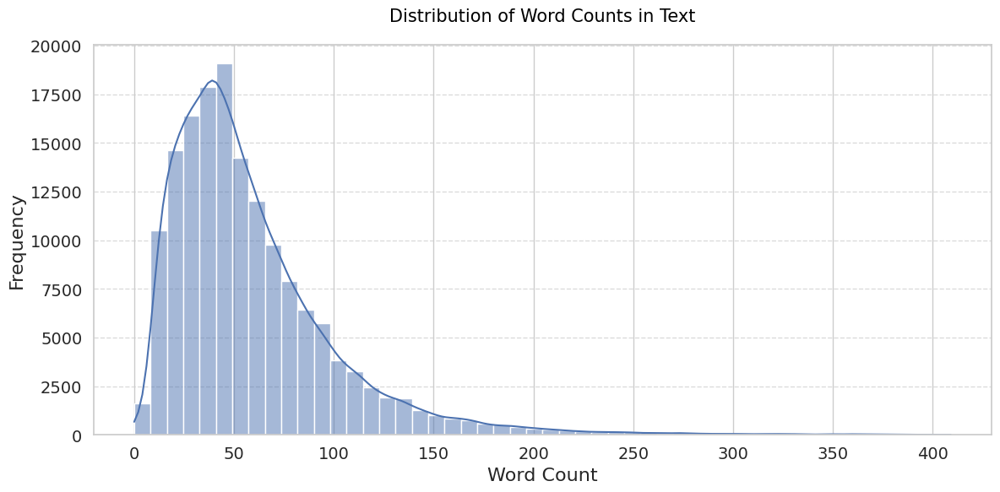

In [140]:
# Fill in empty values in the 'text' column
dr2['text'] = dr2['text'].fillna('')

# Add a new column 'text_word_count' that contains the word count for each text
dr2['text_word_count'] = dr2['text'].apply(lambda x: len(x.split()))

# Set the seaborn style
sns.set(style="whitegrid")

# Plot the distribution of word counts
plt.figure(figsize=(12, 6), dpi=100)
sns.histplot(data=dr2, x='text_word_count', bins=50, palette='cool', kde=True)

# Set title and labels
plt.title("Distribution of Word Counts in Text", fontsize=15, pad=20, color='black')
plt.xlabel("Word Count", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

# Improve display and readability
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()

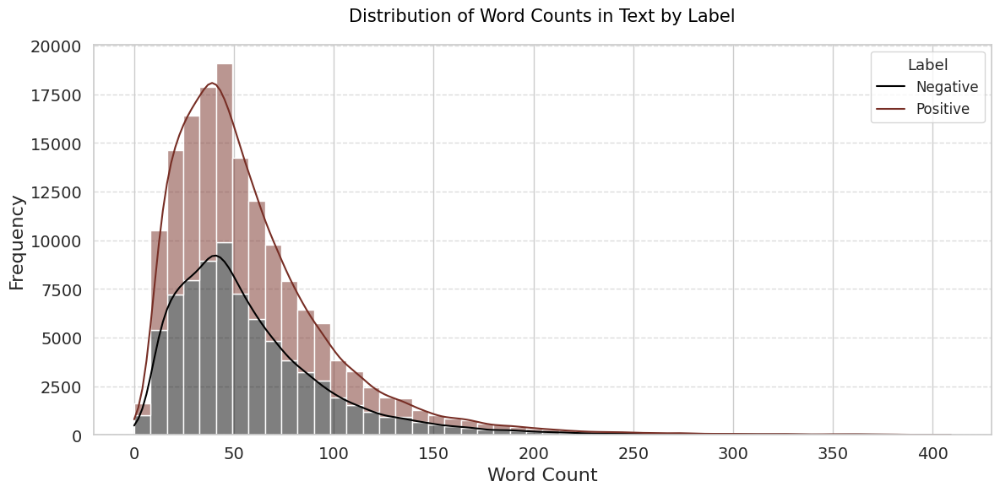

In [141]:
# Add a new column 'text_word_count' that contains the word count for each text
dr2['text_word_count'] = dr2['text'].apply(lambda x: len(x.split()))

# Set the seaborn style
sns.set(style="whitegrid")

# Define custom colors for each class
custom_colors = {0: '#772E25', 1: '#000000'}  # Red for negative, black for positive

# Plot the distribution of word counts, differentiated by labels
plt.figure(figsize=(12, 6), dpi=100)
sns.histplot(data=dr2, x='text_word_count', bins=50, hue='label', multiple="stack", palette=custom_colors, kde=True)

# Set title and labels
plt.title("Distribution of Word Counts in Text by Label", fontsize=15, pad=20, color='black')
plt.xlabel("Word Count", fontsize=16)
plt.ylabel("Frequency", fontsize=16)

# Adjust axis settings
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust legend settings
plt.legend(title="Label", labels=['Negative', 'Positive'], fontsize=12, title_fontsize='13')

# Display the plot
plt.tight_layout()
plt.show()

AFTER (remove_stopwords)..

Text: getting positive reviews ? cream pulls ’ absorb. ’ terrible .
Label: 0.0
Rating: 1
Word Count: 11

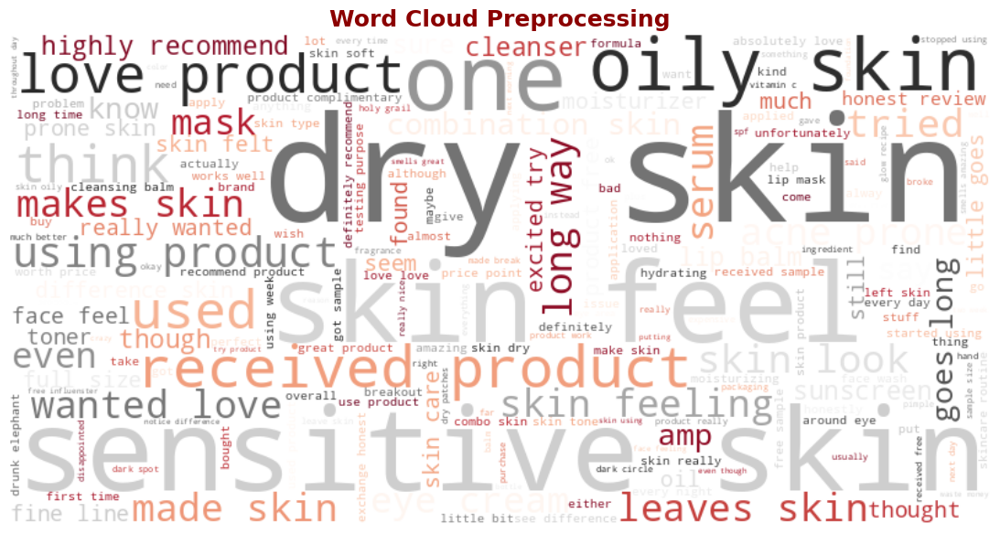

In [142]:
# Create a Console object
console = Console()

# Process the text and calculate the word count after processing
dr2['text'] = dr2['text'].apply(remove_stopwords)
dr2['text_word_count'] = dr2['text'].apply(lambda x: len(x.split()))
console.print(Text('\nAFTER (remove_stopwords)..', style='bold red'))  # Title changed to dark red

# Fetch the specific row for better formatting
row = dr2.iloc[10]

# Format the output for readability
formatted_text = f"Text: {row['text']}\n"
formatted_text += f"Label: {row['label']}\n"
formatted_text += f"Rating: {row['rating']}\n"
formatted_text += f"Word Count: {row['text_word_count']}\n"

# Print the formatted text
console.print(Text(formatted_text, style='black on grey'))  # Display in black on grey

# Membuat WordCloud dari teks yang telah diproses
plt.figure(figsize=(12, 6), dpi=100)
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='RdGy').generate(' '.join(dr2['text']))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud Preprocessing", fontsize=18, fontweight='bold', color='darkred')
plt.tight_layout()
plt.show()

# Feature Selection

In [143]:
from sklearn.feature_extraction.text import TfidfVectorizer

dr2['processed_text'] = dr2['text']

tfidf_vectorizer = TfidfVectorizer(max_features=1000)
tfidf_features = tfidf_vectorizer.fit_transform(dr2['processed_text'])

# Melihat fitur penting
print(tfidf_vectorizer.get_feature_names_out())

['able' 'absolute' 'absolutely' 'absorb' 'absorbed' 'absorbs' 'acid'
 'acne' 'actual' 'actually' 'add' 'added' 'adding' 'addition' 'affordable'
 'after' 'afterwards' 'again' 'aging' 'ago' 'aha' 'alcohol' 'all' 'almost'
 'alone' 'along' 'already' 'also' 'although' 'always' 'amazing' 'amount'
 'amp' 'another' 'anti' 'anymore' 'anyone' 'anything' 'anyway'
 'appearance' 'application' 'applicator' 'applied' 'applies' 'apply'
 'applying' 'appreciate' 'area' 'areas' 'around' 'avoid' 'away' 'awesome'
 'awful' 'baby' 'back' 'bad' 'badly' 'balm' 'balms' 'barely' 'barrier'
 'base' 'based' 'basic' 'basically' 'bc' 'beautiful' 'beautifully'
 'beauty' 'became' 'become' 'bed' 'before' 'behind' 'believe' 'benefit'
 'benefits' 'best' 'better' 'big' 'bigger' 'biggest' 'birthday' 'bit'
 'black' 'blackheads' 'blemishes' 'blend' 'body' 'bomb' 'bother' 'bottle'
 'bought' 'box' 'brand' 'brands' 'break' 'breaking' 'breakout' 'breakouts'
 'breaks' 'bright' 'brightening' 'brighter' 'broke' 'broken' 'bumps'
 'bu

In [144]:
from sklearn.feature_selection import SelectKBest, chi2

# Seleksi fitur menggunakan Chi-Square Test
selected_features = SelectKBest(score_func=chi2, k=500)  # Ambil 500 fitur paling relevan
X_selected = selected_features.fit_transform(tfidf_features, dr2['label'])

# Melihat skor dan fitur terpilih
scores = selected_features.scores_
important_features = tfidf_vectorizer.get_feature_names_out()[selected_features.get_support()]
print("Top 10 Features:", important_features[:10])

Top 10 Features: ['absolute' 'absolutely' 'absorb' 'absorbs' 'actual' 'add' 'adding'
 'addition' 'again' 'aging']


In [145]:
RANDOM_STATE = 42

In [146]:
# Split data into train, validation, and test sets (set aside 20% of data for test)
dr2_train, dr2_test = train_test_split(dr2, test_size=0.20, shuffle=True, random_state=RANDOM_STATE)
dr2_train, dr2_validation = train_test_split(dr2_train, test_size=0.15, random_state=RANDOM_STATE)

print("Training data size:", len(dr2_train))
print("Validation data size:", len(dr2_validation))
print("Test data size:", len(dr2_test))

Training data size: 106828
Validation data size: 18852
Test data size: 31420


In [147]:
# Split data into (Features and Target)
def split_data (DATA_SET):
    # Initialize sentences and labels lists
    sentences = []
    labels = []
    # Loop over all  examples and save the sentences and labels
    for s,l in DATA_SET:
      sentences.append(s)
      labels.append(l)
    # Convert labels lists to numpy array
    labels_final = np.array(labels)
    return sentences, labels_final

# Split data into features and labels
train_sentences, train_labels = split_data(dr2_train[['text', 'label']].values)
validation_sentences, validation_labels = split_data(dr2_validation[['text', 'label']].values)
test_sentences, test_labels = split_data(dr2_test[['text', 'label']].values)

# Tokenizer parameters )Build & train model()
vocab_size = 10000
max_length = 64
embedding_dim = 128
lstm_dim = 32
dense_dim = 16
NUM_EPOCHS = 10
BATCH_SIZE = 256

# Parameters for padding and OOV tokens
trunc_type='post'
padding_type='post'
oov_tok = "<OOV>"

In [148]:
print("Original set:", str(dr2.shape))
print("Training set:", f"{len(train_sentences)}, {len(train_labels)}")
print("Validation set:", f"{len(validation_sentences)}, {len(validation_labels)}")
print("Testing set:", str(dr2_test.shape))

Original set: (157100, 19)
Training set: 106828, 106828
Validation set: 18852, 18852
Testing set: (31420, 19)


In [149]:
# Initialize the Tokenizer class
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)

# Fit the tokenizer on the training sentences to generate the word index dictionary
tokenizer.fit_on_texts(train_sentences)
word_index = tokenizer.word_index # Generate word index

# Generate and pad the training sequences (Tokenize and pad the sequences)
training_sequences = tokenizer.texts_to_sequences(train_sentences)
training_padded = pad_sequences(training_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)

# Generate and pad the validation sequences
validation_sequences = tokenizer.texts_to_sequences(validation_sentences)
validation_padded = pad_sequences(validation_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)
test_sequences = tokenizer.texts_to_sequences(test_sentences)
test_padded = pad_sequences(test_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)

# Convert labels to numpy arrays
training_labels = np.array(train_labels)
validation_labels = np.array(validation_labels)
test_labels = np.array(test_labels)

# Get the tokenized sequence
tokenized_sequence = training_sequences[0]

# Map the tokenized sequence back to words
tokenized_words = [word for word, index in word_index.items() if index in tokenized_sequence]

# Display a sample from the training data and its tokenized and padded version
sample_index = 0  # Change this index to view different samples
original_text = train_sentences[sample_index]
tokenized_sequence = training_sequences[sample_index]
padded_sequence = training_padded[sample_index]

# Model Building

In [150]:
# Set the training parameters
# Build the LSTM model
model_lstm = tf.keras.Sequential([
    Embedding(vocab_size, embedding_dim, input_length=max_length),
    SpatialDropout1D(0.4),
    Bidirectional(LSTM(lstm_dim, return_sequences=True)),
    Bidirectional(LSTM(lstm_dim)),
    Dense(dense_dim, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01)),  # L1 and L2 regularization
    Dropout(0.5),
    Dense(1, activation='sigmoid')])

# Create a dummy input
sample_input = np.random.randint(1, vocab_size, size=(1, max_length))
# Call the model with the dummy input
model_lstm.predict(sample_input)

# Plot the model
tf.keras.utils.plot_model(model_lstm, show_shapes=True)
# Display the model summary with a title
print("### Model Summary ###")
try:
    model_lstm.summary()  # Display model summary
except Exception as e:
    print(f"Error displaying model summary: {e}")

# Plot the model architecture and save as an image
try:
    tf.keras.utils.plot_model(model_lstm, show_shapes=True, to_file='model_lstm.png')
    print("Model architecture saved as 'model_lstm.png'.")
except Exception as e:
    print(f"Error plotting model architecture: {e}")

# Print the number of parameters
try:
    num_params = model_lstm.count_params()  # Count the parameters
    print(f"\nNumber of parameters: {num_params}")
except Exception as e:
    print(f"Error counting model parameters: {e}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
### Model Summary ###


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)              │ (1, 64, 128)                │       1,280,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ spatial_dropout1d_1                  │ (1, 64, 128)                │               0 │
│ (SpatialDropout1D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_2 (Bidirectional)      │ (1, 64, 64)                 │          41,216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_3 (Bidirectional)      │ (1, 64)                     │          24,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (1, 16)                     │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (1, 16)                     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (1, 1)                      │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,347,105 (5.14 MB)

 Trainable params: 1,347,105 (5.14 MB)

 Non-trainable params: 0 (0.00 B)

Model architecture saved as 'model_lstm.png'.

Number of parameters: 1347105


In [151]:
# Compile the model
model_lstm.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3)

# Train the model with callbacks
history_lstm = model_lstm.fit(
    training_padded,
    training_labels,
    epochs=NUM_EPOCHS,
    validation_data=(validation_padded, validation_labels),
    verbose=2,
    callbacks=[early_stopping, lr_scheduler])  # Include both callbacks)

Epoch 1/10
3339/3339 - 53s - 16ms/step - accuracy: 0.8556 - loss: 0.4654 - val_accuracy: 0.8899 - val_loss: 0.3250 - learning_rate: 0.0010
Epoch 2/10
3339/3339 - 52s - 15ms/step - accuracy: 0.8914 - loss: 0.3298 - val_accuracy: 0.8970 - val_loss: 0.2933 - learning_rate: 0.0010
Epoch 3/10
3339/3339 - 81s - 24ms/step - accuracy: 0.9048 - loss: 0.2954 - val_accuracy: 0.8819 - val_loss: 0.3077 - learning_rate: 0.0010
Epoch 4/10
3339/3339 - 82s - 25ms/step - accuracy: 0.9134 - loss: 0.2748 - val_accuracy: 0.9022 - val_loss: 0.2864 - learning_rate: 0.0010
Epoch 5/10
3339/3339 - 82s - 25ms/step - accuracy: 0.9202 - loss: 0.2526 - val_accuracy: 0.9001 - val_loss: 0.2930 - learning_rate: 0.0010
Epoch 6/10
3339/3339 - 82s - 25ms/step - accuracy: 0.9276 - loss: 0.2365 - val_accuracy: 0.9042 - val_loss: 0.2832 - learning_rate: 0.0010
Epoch 7/10
3339/3339 - 80s - 24ms/step - accuracy: 0.9329 - loss: 0.2227 - val_accuracy: 0.9034 - val_loss: 0.2970 - learning_rate: 0.0010
Epoch 8/10
3339/3339 - 82s 

In [159]:
from google.colab import drive
drive.mount('/content/drive')

model_path = "/content/drive/My Drive/Big Data & Data Mining/FP/lstm_sentimentProdukSephora_model.keras"
model_lstm.save(model_path)
print(f"Model saved at: {model_path}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model saved at: /content/drive/My Drive/Big Data & Data Mining/FP/lstm_sentimentProdukSephora_model.keras


# Evaluate Model

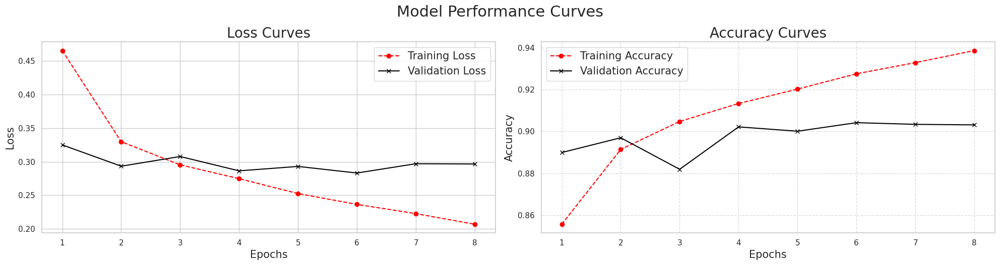

982/982 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step


In [152]:
# Plotting training history
def plot_loss_curves(history):
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    epochs = range(1, len(train_loss) + 1)
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label="Training Loss", color='red', marker='o', linestyle='--')
    plt.plot(epochs, val_loss, label="Validation Loss", color='black', marker='x', linestyle='-')
    plt.title("Loss Curves", fontsize=20)
    plt.xlabel('Epochs', fontsize=15)
    plt.ylabel('Loss', fontsize=15)
    plt.legend(fontsize=15)
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracy, label="Training Accuracy", color='Red', marker='o', linestyle='--')
    plt.plot(epochs, val_accuracy, label="Validation Accuracy", color='Black', marker='x', linestyle='-')
    plt.title("Accuracy Curves", fontsize=20)
    plt.xlabel('Epochs', fontsize=15)
    plt.ylabel('Accuracy', fontsize=15)
    plt.legend(fontsize=15)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.suptitle('Model Performance Curves', fontsize=22, y=1.05)
    plt.show()

plot_loss_curves(history_lstm)

# Predict the labels for the test data
test_predictions = model_lstm.predict(test_padded)
test_predictions = (test_predictions > 0.5).astype(int).flatten()

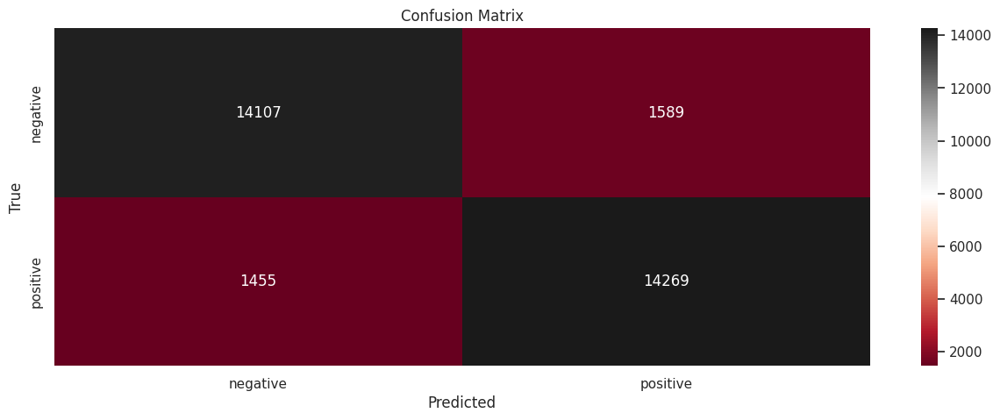

In [153]:
# Compute the confusion matrix
cm = confusion_matrix(test_labels, test_predictions)

# Define the ConfusionMatrixPlotter class
class ConfusionMatrixPlotter:
    def __init__(self, true_labels, predicted_labels, labels):
        self.true_labels = true_labels
        self.predicted_labels = predicted_labels
        self.labels = labels


    def plot(self):
        cm = confusion_matrix(self.true_labels, self.predicted_labels)
        plt.figure(figsize=(15, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='RdGy', xticklabels=self.labels, yticklabels=self.labels)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title('Confusion Matrix')
        plt.show()

# Define the labels
labels = ["negative", "positive"]

# Create an instance of ConfusionMatrixPlotter
cm_plotter = ConfusionMatrixPlotter(test_labels, test_predictions, labels)

# Plot the confusion matrix
cm_plotter.plot()

In [154]:
from sklearn.metrics import classification_report

print(classification_report(test_labels, test_predictions, zero_division=0))

              precision    recall  f1-score   support

         0.0       0.91      0.90      0.90     15696
         1.0       0.90      0.91      0.90     15724

    accuracy                           0.90     31420
   macro avg       0.90      0.90      0.90     31420
weighted avg       0.90      0.90      0.90     31420



# Analisa dan Pembahasan

Akurasi model dengan Algoritma LSTM ini mencapai 90%, dengan nilai F1 Score 0.9 melalui 8/10 Epoch.
- Nilai Training Accuracy dan Validation Accuracy sama-sama meningkat, menunjukkan bahwa model berkinerja baik pada set pelatihan dan validasi.
- Akurasi validasi tetap kuat dan stabil, berarti model digeneralisasi dengan baik dan berkinerja secara konsisten.

